In [217]:
#This is the notebook we will use for the wavefront sensor lab! How exciting the last one of the quarter. 
import numpy as np
import math as m 
from scipy.ndimage import gaussian_filter, maximum_filter
from matplotlib.patches import Circle
from astropy.io import fits
import matplotlib as mpl
import pylab
import sys; sys.path.append('/home/a180i/lib/python/')
import a180
import os
from matplotlib.patches import Circle
import random

In [218]:
#Step one is till you get to the matching spots on the wavefront sensor seciton 

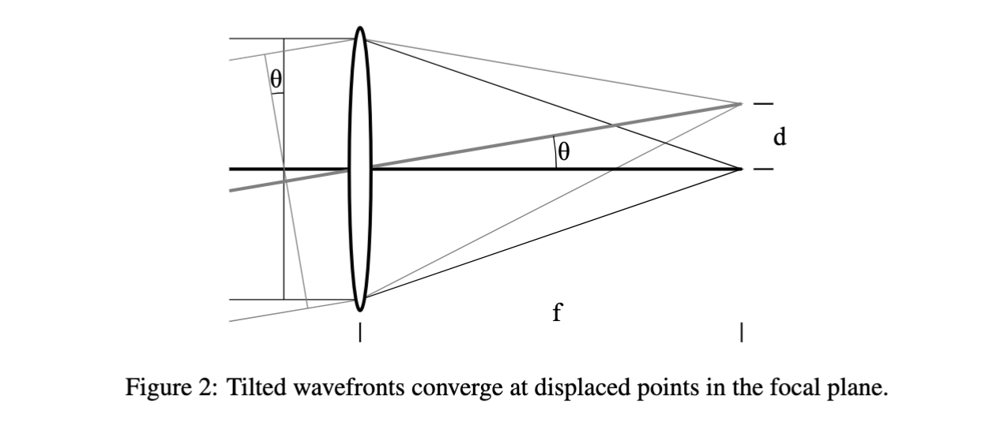

**Eperiment 1: You have a 25mm lens in the C-mount attached to a CMOS detector, and a collimated light source. The goal of this experiment is to verify the expected displacement of the spot image on the detector given a measured change in the angle of the input phase front**

We measured the distacne with a ruler to be .12cm, we can use images taken to calcualte the actual displacemnt in microns. 

In [219]:
def find_centroid_of_brightest_star(image, psf_sigma=5, display_plot=False):
    """
    Finds the centroid of the brightest star in the given image using a Gaussian
    filter and a maximum filter to identify the peak location.
    """
    # Smooth the image to reduce noise and enhance the star feature
    filtered_image = gaussian_filter(image, sigma=psf_sigma)
    max_filter_size = int(2.35 * psf_sigma)  # Approximate FWHM

    # Apply a maximum filter to locate local maxima
    maximum_filtered_image = maximum_filter(filtered_image, size=max_filter_size)
    is_global_peak = ((filtered_image == maximum_filtered_image) &
                      (filtered_image != 0.0) &
                      (maximum_filtered_image == np.max(maximum_filtered_image)))

    # Extract the coordinates of peak locations
    peak_locations = np.nonzero(is_global_peak)
    star_positions = np.array(peak_locations).T
    centroid_position = np.median(star_positions, axis=0)

    # Display plot if requested
    if display_plot:
        norm = mpl.colors.LogNorm(vmin=np.nanpercentile(image, 1), vmax=np.nanpercentile(image, 99.9))
        fig, ax = plt.subplots(figsize=(12, 8))
        color_bar = ax.imshow(image, origin='lower', norm=norm)
        plt.colorbar(color_bar)
        ax.add_patch(mpl.patches.Circle((centroid_position[1], centroid_position[0]), radius=5.0, edgecolor='r', fill=True))
    
    return centroid_position


In [220]:
import matplotlib.pyplot as plt
import matplotlib.image as img
import numpy as np
from astropy.io import fits
import os.path


def convert_to_fits(filename, overwrite=False):
    if not os.path.isfile(filename):
        print('Input file does not exist!')
        return

    im_orig = img.imread(filename)
    if len(im_orig.shape)==3:
        im = im_orig[:,:,0]
    elif len(im_orig.shape)==2:
        im = im_orig
    else:
        raise NotImplementedError

    newfilename = '.'.join(filename.split('.')[:-1]+['fits'])

    print("converting %s to %s" % (filename, newfilename))
    if os.path.isfile(newfilename) and not overwrite:
        print('Output FITS file already exists, skipping')
    else:
        fits.writeto(newfilename, im, overwrite=overwrite)




In [221]:
#Convert the png files taken into fits file so we can open and examine them 
#The images taken are not helpful for group 4, images from group 1 are used for this calculation
data_dir = '/data/2024-Fall/20241125_Grp4/'
fn1 = 'Exp1Phot1a.fits'
fn2 = 'Exp1Phot1b.fits'
Ex1a = convert_to_fits(data_dir + '/Exp1Phot1a.png')
Ex1b = convert_to_fits(data_dir + '/Exp1Phot1b.png')

converting /data/2024-Fall/20241125_Grp4//Exp1Phot1a.png to /data/2024-Fall/20241125_Grp4//Exp1Phot1a.fits
Output FITS file already exists, skipping
converting /data/2024-Fall/20241125_Grp4//Exp1Phot1b.png to /data/2024-Fall/20241125_Grp4//Exp1Phot1b.fits
Output FITS file already exists, skipping


[271. 275.]
[276. 419.]
Distance translated horizontally in the x direction is 144.0 pixels
This corresponds to 864.0 microns, which is 0.0864cm
We have a discrepency with .12cm measures with a ruler and .0864cm using pixel scale


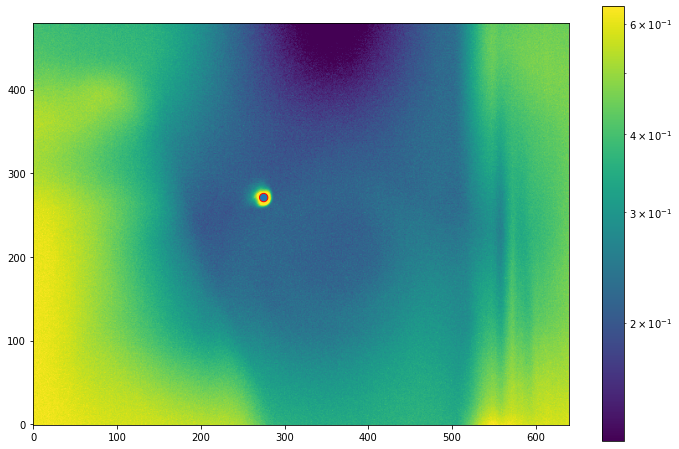

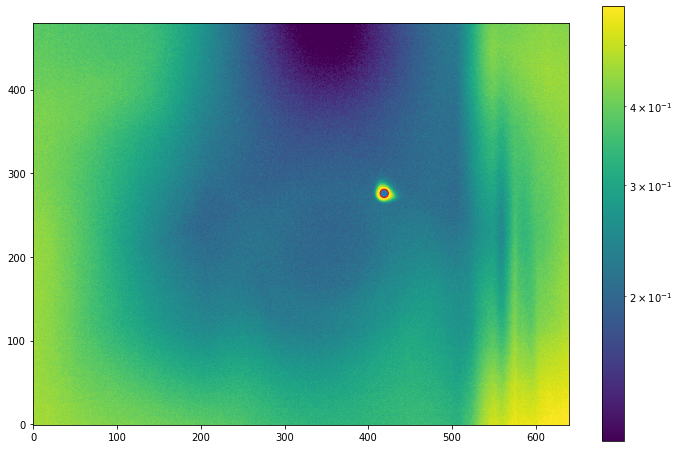

In [222]:
#Load in the new fits files to preform the centroid function
file1 = data_dir + fn1
file2 = data_dir + fn2
im1 = fits.getdata(file1)
im2 = fits.getdata(file2)


Centroid_1 = find_centroid_of_brightest_star(im1, display_plot = True)
Centroid_2 = find_centroid_of_brightest_star(im2, display_plot = True)

print(Centroid_1)
print(Centroid_2)

translation_x = Centroid_2[1] - Centroid_1[1]
microns_translated = translation_x * 6
cm_translated = microns_translated * 10e-5

print(f'Distance translated horizontally in the x direction is {translation_x} pixels')
print(f'This corresponds to {microns_translated } microns, which is {cm_translated}cm')
print(f'We have a discrepency with .12cm measures with a ruler and .0864cm using pixel scale')

*Q1: By what distance d is the focus displayed for lens with focal length f, given a wavefront tilt angle theta? In the small angle approximation?* 

It is clear that a right tringle forms between the lens, the focal length f, and the distance d. A right triangle can be made using the angle theta. 

If we are given the figure we can see that $$tan(\theta) = \frac{d}{f}$$
So we end up with a distance $$d = f*tan(\theta)$$

If we assume a small angle approximation then we can recal that for small angles $tan(\theta) \approx \theta$
$$\theta = \frac{d}{f}$$  $$d = f\theta$$




In [223]:
#We can calculate the angle theta using both the distance from the rulers and the pixels.
f = 40.5 #cm
d1 = .12 #cm
d2 = .0864 #cm
theta1 = round(d1/f,4)
theta2 = round(d2/f,4)

print(f'The angle calcualted using distance mesured with the ruler is {theta1}')
print(f'The angle calcualted using distance measured with pixel count is {theta2}')


The angle calcualted using distance mesured with the ruler is 0.003
The angle calcualted using distance measured with pixel count is 0.0021


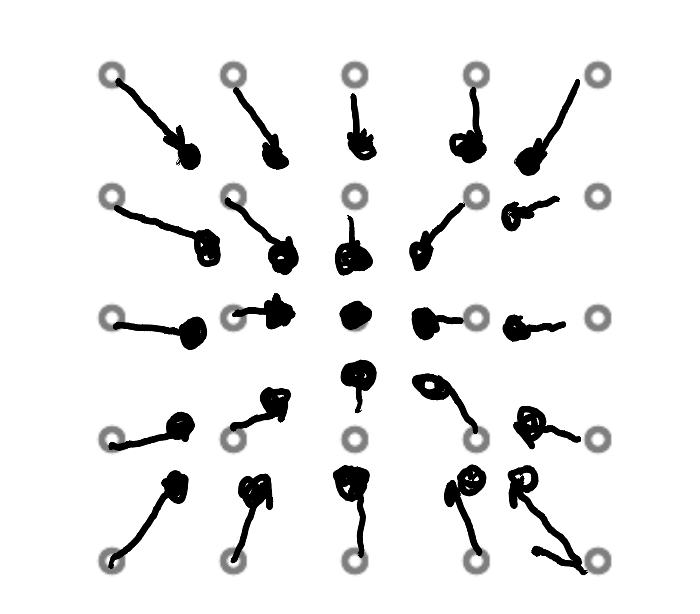

*Q2: What would the displacement pattern look like if a positive lens were placced in the collimated bean entering the sensor? (The open circles represent the reference spot positions for a flat incoming wavefront. Overlay this figure with the expected dot pattern. Discuss with your professor or T.A)*

We can overlay two images here to represent what would happen when a positive lens is placed in front of the beam. The circles before would appear as they do in the first image, with no alteration. However when the positve lens is placed in front of the beam the dots will move in towards the center with the dots furthest away from the center moving the greatest amount while the center dot stays in the same place. The image will appear to be pinched together. This is because the positive lense will focus the light to a central point, the focal point, located behind our detector. The image will thus pinch together as in the figure above, the new dots (in black) represents the basic movement due to the positive lens. You can see how the end result is a smaller image with the same number of dots but now scrunched closer togehter. 





*Q3: What would happen if the spots were focused directly on the detector? How many pixels between each spot, and how many spots will be imaged? 

When the spots are focused directly on the iamge, we are looking at a setup without the lens. This means that we have simply the light source, the lenslet array, and the detector. We can find the maximum amount of dots which could be image by assuming the light is directly on the detector. The size of resulting image and the pattern can be calcualted to see how many spots should be imaged. We know the ThorLabs MLA300-14AR, is a 10mm x 10mm microlens array with a square grid of microlenses which have a 300$\mu$m pitch (distance apart). We also know that each lenslet has a 14mm focal length, so to image it directly we need to achieve 14mm distacne away from the detector. In addition we know the detector has a 752 x 480 pixel scale with 6$\mu$m square pixels. 

We will see that we are missing a lot of the spots, the total array is roughly 30x30 so we should see at least 900 dots. We will see vastly less if we are directly at the detection site. 



In [224]:
#Putting this all togheter we can calculate the pixel seperation between each spot, and how many pixels imaged
pitch = 300 #micrometer
x_axs = 752 #pixels 
y_axs = 480 #pixels 
delta_x = 6 #micrometer

#divide pitch by pixel seperation to see the amount of pixels which seperate each dot 
sep = 300/6 
#Divide the dimensions of the detector by this seperation to get how many dots will fit 
x_dot = x_axs/sep 
y_dot = y_axs/sep 

#Round down these two values to the nears whole number to get accurate pixel count
wx_dot = m.floor(x_dot)
wy_dot = m.floor(y_dot)

#Multiply the two to get the total number of dots which would fit in these dimension 
total_dot = wx_dot * wy_dot 

print(f'The seperation in pixels between each dot on the detector is: {sep}')
print(f'The total number of dots which can fit in the 752x480 pixel detectoris: {total_dot}' )

#Total number of dots on the lenslet array, Divide 10mm x 10mm  by the pitch 300 microns, how many dots fit.
xl = m.floor(10e3/300)
yl = m.floor(10e3/300)

total_dot = xl * yl

print(f'Compare this to the total number of dots on the image which is {total_dot} dots. Cleary we are missing a lot!')

The seperation in pixels between each dot on the detector is: 50.0
The total number of dots which can fit in the 752x480 pixel detectoris: 135
Compare this to the total number of dots on the image which is 1089 dots. Cleary we are missing a lot!


**Experiment 2: Are you able to obtain focused spots on the detector?**

No, we cannot get phsycially clsoe enough to the detector to get a focused image. The spots are out of focus. 

*Q4: What do you expect the physical spacing between spots to be on the detector in microns? In pixels? Note the values for the various length scales are given in Table 1.*

Looking at the sensor design above, we can calcualte the spacing between dots on the detector after passing through the proposed S-H sensor 


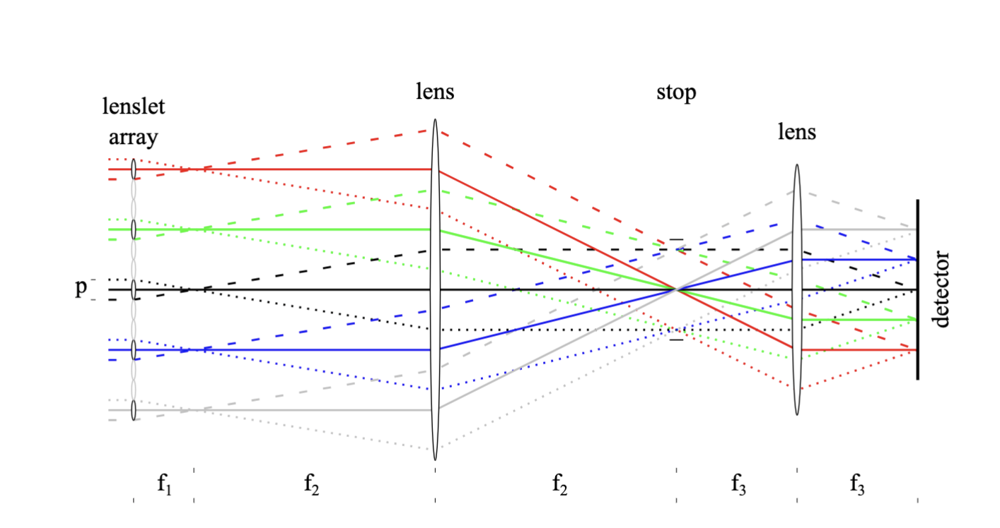

Now we are trying to solve the problem of focusing the array onto the detector, and optomizing the space on the detector to have more spots closer toghether so that we can get an accurate measuremnt of the distortions casued by the atmosphere. The finer this array on the detector the more sensative it will be to changes.
Now we have it all set up it looks like the figure above. The dimensions of everything are as follows. 

Lesnlet array - pitch - 300 micrometers

Lenslet array - focal length - 14 millimeters 

lens - focal length - 75 millimeters 

lens2 - focal length 25 millimeters

Detector - pixel size - 6 micrometers 

Now we can calcualte what the dots should look like on the detector after going through this set up, we should expect much smaller seperation between pixels. 

In [225]:
#Lets calcualte the seperation between spots as we pass throught the S-H sensor. 
#This process is reletivly striaght-forward and uses the focal lengths to determine image magnification. 
f2 = 75 #mm
f3 = 25 #mm 
M = f3/f2

#We can multiply the physcal distacne between the array by the magnification to get new pitch
new_pitch = M * pitch
#Again divide this number in micormeteters by number of pixels/micrometer to get seperation
new_sep = new_pitch/delta_x
new_sep = round(new_sep,1)
print(f'The new distance between dots after going through the proposed S-H detector is about {new_sep} pixels')
print(f'In microns this coresponds to about {new_pitch} microns, 1/3 of the original pitch')



The new distance between dots after going through the proposed S-H detector is about 16.7 pixels
In microns this coresponds to about 100.0 microns, 1/3 of the original pitch


*Q5: You calculated the physcial displacement of a spot in the lenslit focal plane for a beam deviation of angle $\theta$. What will this displacemnt be in the detector plane, in pixels?* 

We have the equation to find the displacemnt of an image using the focal length and an angle $\theta$. We measured the angle to be either .21 or .300, we can now calcualte the anticipated displacement. We need to calculate the displacemnt we expect to see and then multiply by 1/3 to adjust for the demagnification effect.



In [226]:
#Calculate the expected translation if we were going through this magnification using S-H. divide by 3

Md = round((theta2 * f)/3 , 3) #cm

Md_pixels = round((Md * 10e3)/6)

print(f'The expected translation of a dot if moved at the same angle theta as in Experiment 1 is {Md}cm')
print(f'In pixels this corresponds to about {Md_pixels} pixels in horizontal translation' )

The expected translation of a dot if moved at the same angle theta as in Experiment 1 is 0.028cm
In pixels this corresponds to about 47 pixels in horizontal translation


*Q6: What will the displacemnt be as a fraction of the spacing between spots?*

Well we know how much space there is in pixels between each dot and we know that if we move by an angle $\theta = .0030$ we will see a displacemnt of about 47 pixels. We can find the dispalcemnt as a fraction of the spacing between dots simply by dividing. The displacemnt as a fraction will be: $$\frac{47}{17}$$

The dots are displaced by almost 3x the distance which seperates them!


In [227]:
#Take equations from Q5 and divide by Q4 answers 
frac = round(Md_pixels/new_sep,1)

print(f'The displacement as a fraction of the spacing between dots is {frac}x')


The displacement as a fraction of the spacing between dots is 2.8x


**Experiment 3: Assemble the Shack-Hartmann sensor laid out in Figure 8 using the components at hand. Use a ruler to assit you in placing the optics at the appropriate distance**

 Once we complete the set up we can determine the distance of everything using the focal length of the equipment. We set it up properly but there could be some difficulties in measurement as we are using a ruler to set everything at the precise distacne, the ruler is in cm and mm but there is clearly an element of human error which could be at play. The ideal setup was the best way to go, by simply following the figure there was plenty of light and good results. The biggest stressor was mwssing with the fiber optic cable. 

*Q7: What is the purpose of the aperture stop? Verify your hypothesis by removing and replacing the stop from its post holder and examining the effects on the detected image.*

The aperture stop is used to block out other sources of light, so that we are only getting light from the source. This makes surre that the detector only gets the light coming from our light source and minimizes any additional scattering of light from outside the scope of our source. Without the stop we can see that the light is too much, in fact we can change the size of the stop and notice how its difficult to get results if the stop is too large as the image becomes muddles with external factors of light and is not concentrated at the dots. 

*Q8:How big should the aperture stop be?*

The aperture stop can be calcualted using basic geometry, the rays at the maximum height have a known angle and distance, we can easliy compute a maxium radius for the stop. The maximum radius should be under 1 mm at about .80mm. The diameter would be maximum 2 with a preference for exaclty 1.6mm. 




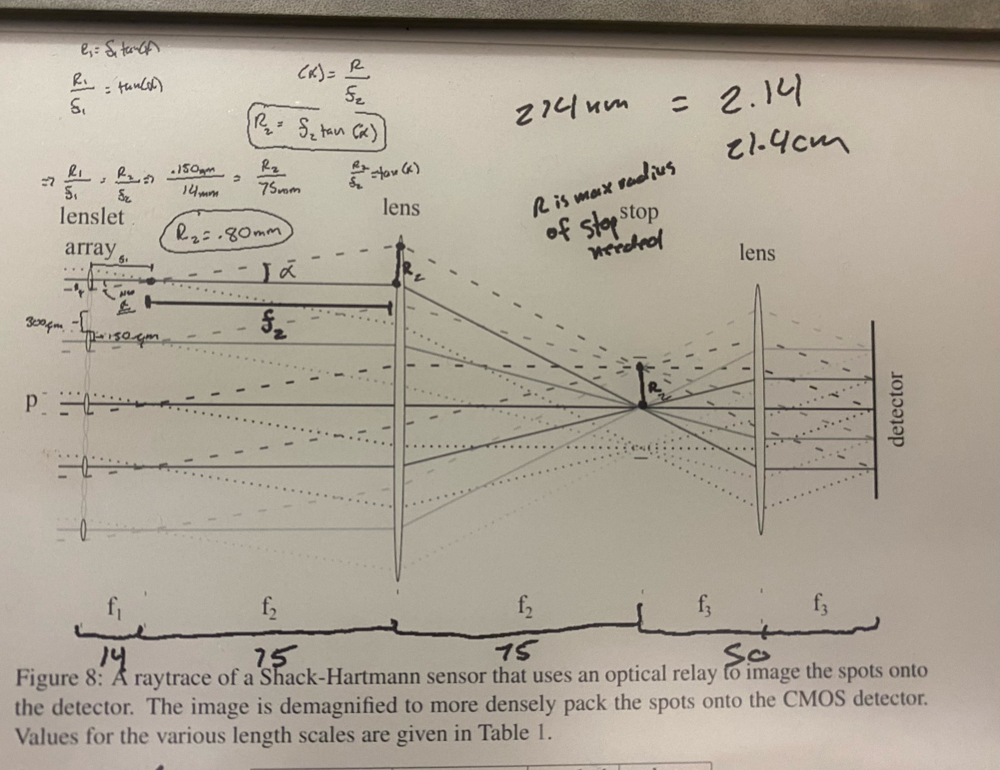

**Experiment 4: Obtain an image of the focused sponts on the CMOS detector. Measure the distance between the spots in pixels, and compare to your calculation above. If they disagree, what might be the cause(s)?**

converting /data/2024-Fall/20241125_Grp4/Exp4Phot1.png to /data/2024-Fall/20241125_Grp4/Exp4Phot1.fits
Output FITS file already exists, skipping


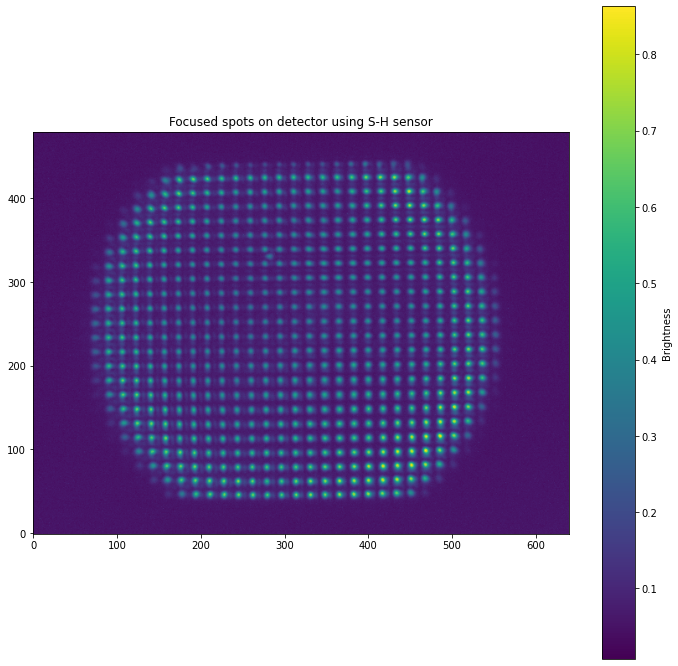

In [228]:
Ex4 = convert_to_fits(data_dir + 'Exp4Phot1.png')
file3 = data_dir + '/Exp4Phot1.fits'
im3 = fits.getdata(file3)

plt.figure(figsize=(12, 12))
plt.imshow(im3, cmap="viridis", origin="lower")
plt.colorbar(label="Brightness")
plt.title("Focused spots on detector using S-H sensor")
plt.show()

In [335]:
def multiple_centroids(im, psf_sig = 3, display_plot = False):

    filtered_mosaic = gaussian_filter(im, sigma=psf_sig) # apply the filter

    # identify peaks in the image
    from scipy.ndimage import maximum_filter
    max_filt = int(2.35*psf_sig) # [pix] size of maximum filter
    mim = maximum_filter(filtered_mosaic, size=max_filt)  # perform maximum filter


    ispeak = ((filtered_mosaic == mim) & (filtered_mosaic != 0.) & (mim >= .09))



    # now turn these into a list
    peaklocs = np.nonzero(ispeak) # this is a 2-tuple of 1d arrays
    starpos_mos = np.array(peaklocs).T # this is now an array of N stars by 2
    N_star = starpos_mos.shape[0]
    print("{} stars detected".format(N_star))

    # set up the figure
    fig = plt.figure(figsize = (12,12))
    ax = fig.add_subplot(111)

    # show the mosaic
    ax.imshow(im,cmap = 'viridis', origin='lower', vmin=np.nanpercentile(mos_VC,2) ,vmax=np.nanpercentile(mos_VC, 98))

    # annotate the star detections
    for i in range(N_star):
        y, x = starpos_mos[i,:]
        # draw a circle centered at this location
        circle = Circle((x, y), radius=psf_sig, color='red', fill=False, linewidth=1)  
        #ax.add_patch(circle)
        ax.add_patch(circle)
    


    pylab.draw()
    pylab.show()
    
    return starpos_mos


612 stars detected


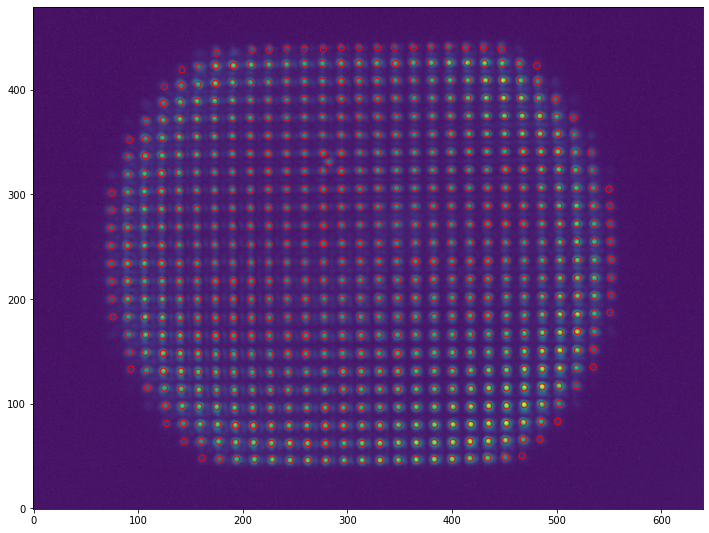

In [331]:
Mos1 = multiple_centroids(im3, display_plot = True)

In [275]:
#We now have an array of values corresponding to the positions in pixels of this image
#We can find the distance between each pixel and compare it to our answer from before

def find_median_diff(Array):
    n=0
    pix = []
    for i in Array: 
        x = Array[i][0][1]
        y = Array[i+1][0][1]
        diff = y-x
        pix.append(diff)
        i += 1
    return pix


dpx_Mos1= find_median_diff(Mos1)

mdpx_Mos1= np.median(dpx_Mos1)
print(mdpx_Mos1)

17.0


In this code we can show that the median distance between pixels is 17! Just like we predicted in the math. There are small distortions as well but a vast majority of distacnes between pixels (85%) fall between [15,19] pixels apart from each other. These small variations can come from the centroid function not positioning the brightest spot right in the center of our dots. Additionally these small variations could even come from the light moving through the air from the source to the detector. Either way the calcualtion can be confirmed. There are a few outliers from the way the array was created, there are some pixels being subtracted from opposite sides or at strange angles as in the array they are not side by side each other. These values can be ignored.

**Experiment 5: Can you observe displacements from fluctuations in the optical path through a transparent material, like plastic?**

Here we have to take our fits file and load them in to compare before and after the plastic lens. We should notice a diffrernce in the amount of seperation and perhaps see inaccuracies caused by the plastic blocking light

converting /data/2024-Fall/20241125_Grp4//Exp5Phot1.png to /data/2024-Fall/20241125_Grp4//Exp5Phot1.fits
Output FITS file already exists, skipping
converting /data/2024-Fall/20241125_Grp4//Exp5Phot2.png to /data/2024-Fall/20241125_Grp4//Exp5Phot2.fits
Output FITS file already exists, skipping


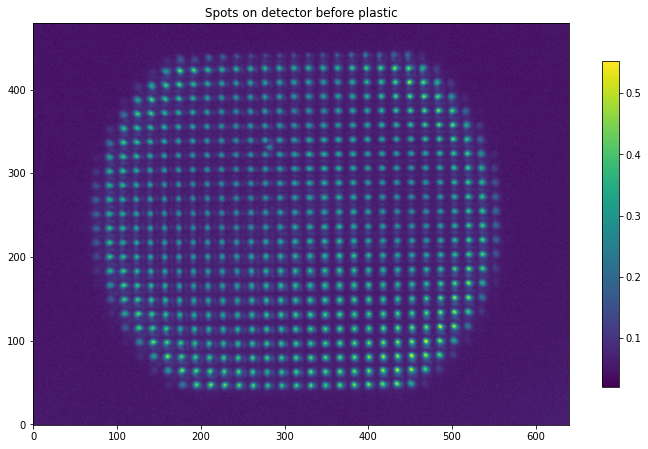

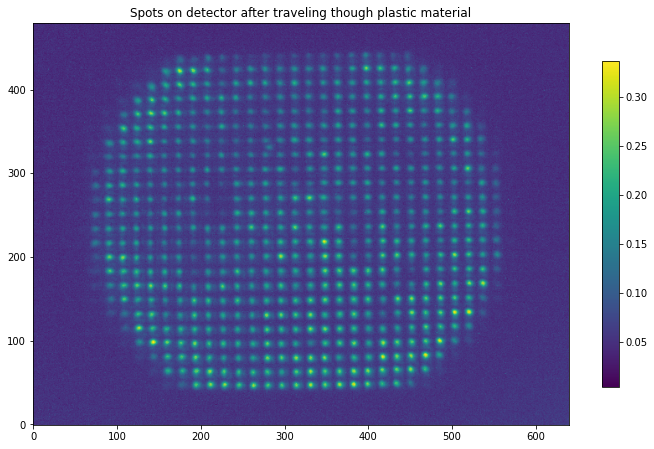

In [232]:
#Lets load in our image and see if we get any different results when light passes through plastic
Exp5a = convert_to_fits(data_dir + '/Exp5Phot1.png')
Exp5b = convert_to_fits(data_dir + '/Exp5Phot2.png')

file4 = data_dir + '/Exp5Phot1.fits'
file5 = data_dir + '/Exp5Phot2.fits'

im4 = fits.getdata(file4)
im5 = fits.getdata(file5)

plt.figure(figsize=(12, 12))
plt.imshow(im4, cmap="viridis", origin="lower")
plt.colorbar(shrink = .5)
plt.title("Spots on detector before plastic")
plt.show()

plt.figure(figsize=(12, 12))
plt.imshow(im5, cmap="viridis", origin="lower")
plt.colorbar(shrink = .5)
plt.title("Spots on detector after traveling though plastic material")
plt.show()


There is a clear difference. The plastic has distorted the positions of the dots and has blocked out some light, probably due to dust or other imperfections in the plaastic. 

590 stars detected


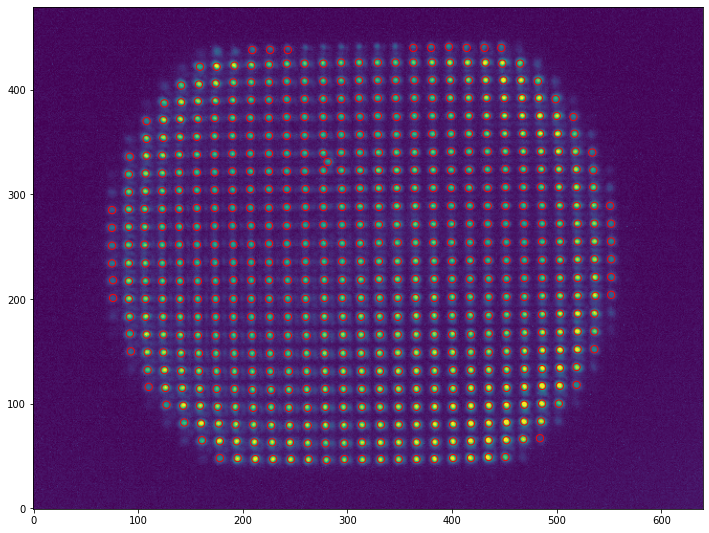

589 stars detected


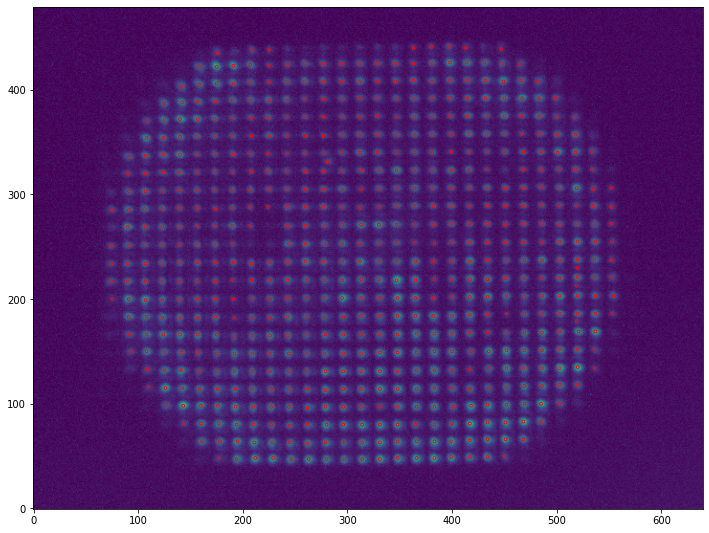

In [433]:
Mos2 = multiple_centroids(im4, 3.5,display_plot = True)
Mos3 = multiple_centroids(im5,1.3, display_plot = True)

In [358]:
Mos2_Dpix = find_median_diff(Mos2)
print(np.median(Mos2_Dpix))



pic = []  # Ensure `pic` is defined as a list
for i in range(len(Mos3) - 1):  # Iterate over indices (not elements) except the last one
    z = Mos3[i][1]       # Access the element at index [0][1] in the current sublist
    q = Mos3[i+1][1]     # Access the same position in the next sublist
    minus = q - z           # Calculate the difference
    pic.append(minus)       # Append the difference to `pic`

print(np.median(pic))


17.0
17.0


In [437]:
import numpy as np


print(len(Mos2))
print(len(Mos3))
def Displacement(Mos2, Mos3):
    # Trim the larger array to match the size of the smaller array
    min_length = min(len(Mos2), len(Mos3))
    Mos2 = Mos2[:min_length]
    Mos3 = Mos3[:min_length]

    # Convert Mos2 and Mos3 into NumPy arrays for easier manipulation
    Mos2 = np.array(Mos2)
    Mos3 = np.array(Mos3)

    # Calculate displacement
    Disp_plastic = Mos3 - Mos2

    return Disp_plastic





590
589


In comparing the location of the pixels before and after the plastic it seems there was movement concentrated in certain areas. While most of the image stayed the same there are some parts which moved a lot. These concentrated areas all move in the same direction and have roughly the same magnitude change. This shows that the inhomogenous nature of the plastic has certain pockets which caused the light to be distorted in certian areas. Not unlike the Earth's atmosphere we can see these pockets of movemnt and address them!

In [438]:
Disp23 = Displacement(Mos2,Mos3)



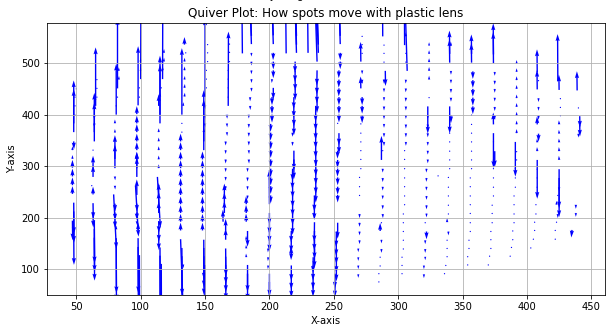

In [496]:
#Lets plot a quiver plot to show how much each point is changing in x and y. 



X,Y = zip(*Mos3)
U,V = zip(*Disp23)

fig, ax = plt.subplots(figsize = (10, 5))

q = ax.quiver(X, Y, U, V,angles='uv', units = 'width', color = 'b')
ax.quiverkey(q, X=0.3, Y=1.1, U=0,
             label='Quiver key, length = 10', labelpos='E')



ax.set_xlabel('X-axis')
ax.set_ylabel('Y-axis')
ax.set_title('Quiver Plot: How spots move with plastic lens')
ax.grid(True)
plt.show()


**Experiment 6: Locate some sources of fixed aberration, for example additional lenses. Use the sensor to both qualitatively and quantitatively examine spot displacements. 1.) Save an unaberrated image of the spots 2.)Place several lenses in the beam and qualitativly comapre the field dependence 3.) Compare quantitaitve displacements you would expect**

In [320]:
#Ok lets convert files to fits and load them in to see some change due to lenses, we already have our basis
Exp6ai = convert_to_fits(data_dir + '/Exp6Phot_N1.png')
Exp6aii = convert_to_fits(data_dir + '/Exp6Phot_P1.png')
Exp6bi = convert_to_fits(data_dir + '/Exp6Phot_N4.png')
Exp6bii = convert_to_fits(data_dir + '/Exp6Phot_P4.png')
Exp6c = convert_to_fits(data_dir + '/Exp6Phot_ConvexCylinder.png')


N1 = fits.getdata(data_dir + '/Exp6Phot_N1.fits')
P1 = fits.getdata(data_dir + '/Exp6Phot_P1.fits')
N4 = fits.getdata(data_dir + '/Exp6Phot_N4.fits')
P4 = fits.getdata(data_dir + '/Exp6Phot_P4.fits')
Cvx = fits.getdata(data_dir + '/Exp6Phot_ConvexCylinder.fits')


converting /data/2024-Fall/20241125_Grp4//Exp6Phot_N1.png to /data/2024-Fall/20241125_Grp4//Exp6Phot_N1.fits
Output FITS file already exists, skipping
converting /data/2024-Fall/20241125_Grp4//Exp6Phot_P1.png to /data/2024-Fall/20241125_Grp4//Exp6Phot_P1.fits
Output FITS file already exists, skipping
converting /data/2024-Fall/20241125_Grp4//Exp6Phot_N4.png to /data/2024-Fall/20241125_Grp4//Exp6Phot_N4.fits
Output FITS file already exists, skipping
converting /data/2024-Fall/20241125_Grp4//Exp6Phot_P4.png to /data/2024-Fall/20241125_Grp4//Exp6Phot_P4.fits
Output FITS file already exists, skipping
converting /data/2024-Fall/20241125_Grp4//Exp6Phot_ConvexCylinder.png to /data/2024-Fall/20241125_Grp4//Exp6Phot_ConvexCylinder.fits
Output FITS file already exists, skipping


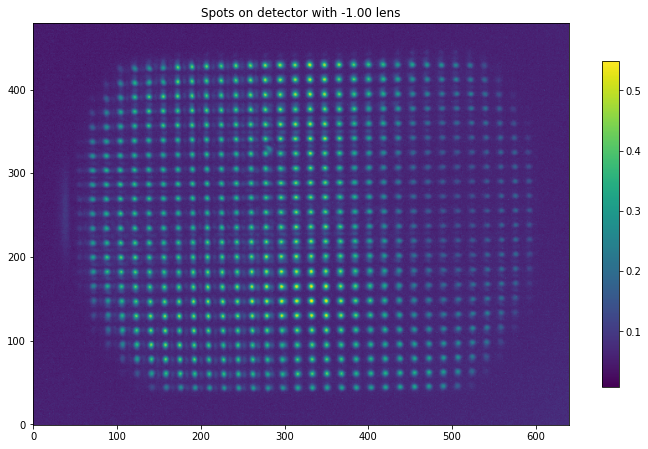

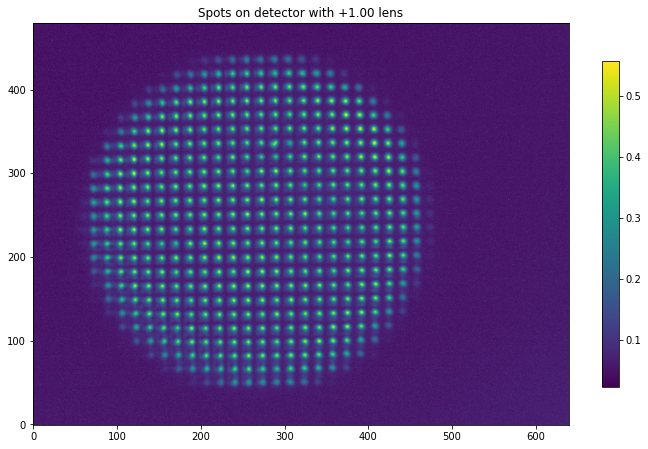

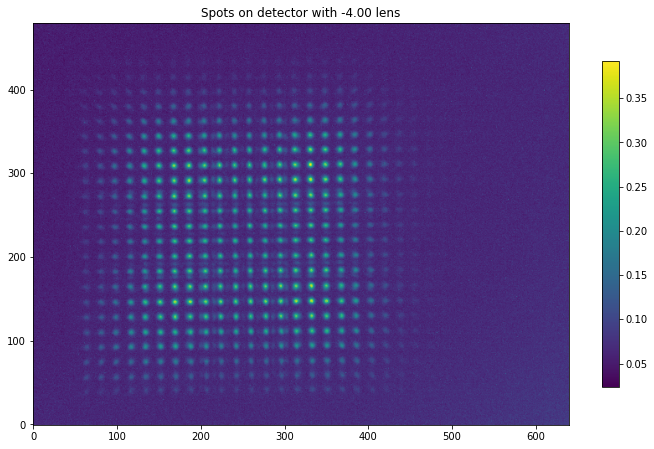

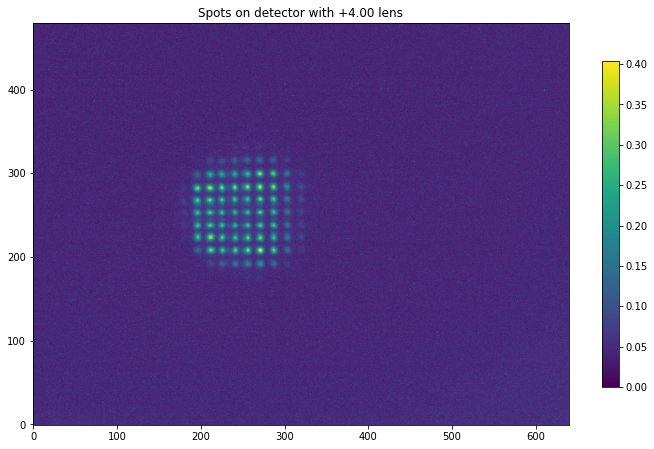

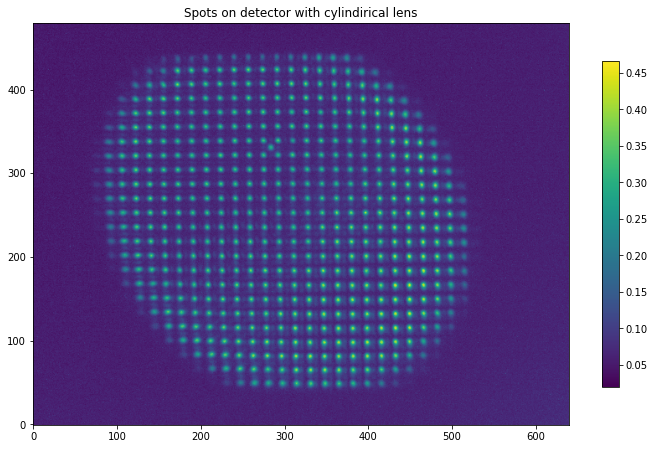

In [492]:
plt.figure(figsize=(12, 12))
plt.imshow(N1, cmap="viridis", origin="lower")
plt.colorbar(shrink = .5)
plt.title("Spots on detector with -1.00 lens")
plt.show()

plt.figure(figsize=(12, 12))
plt.imshow(P1, cmap="viridis", origin="lower")
plt.colorbar(shrink = .5)
plt.title("Spots on detector with +1.00 lens")
plt.show()

plt.figure(figsize=(12, 12))
plt.imshow(N4, cmap="viridis", origin="lower")
plt.colorbar(shrink = .5)
plt.title("Spots on detector with -4.00 lens")
plt.show()

plt.figure(figsize=(12, 12))
plt.imshow(P4, cmap="viridis", origin="lower")
plt.colorbar(shrink = .5)
plt.title("Spots on detector with +4.00 lens")
plt.show()

plt.figure(figsize=(12, 12))
plt.imshow(Cvx, cmap="viridis", origin="lower")
plt.colorbar(shrink = .5)
plt.title("Spots on detector with cylindirical lens")
plt.show()



Can see the displacemnt changes! AND can see the patters we are looking for! Time to compare distacne

602 stars detected


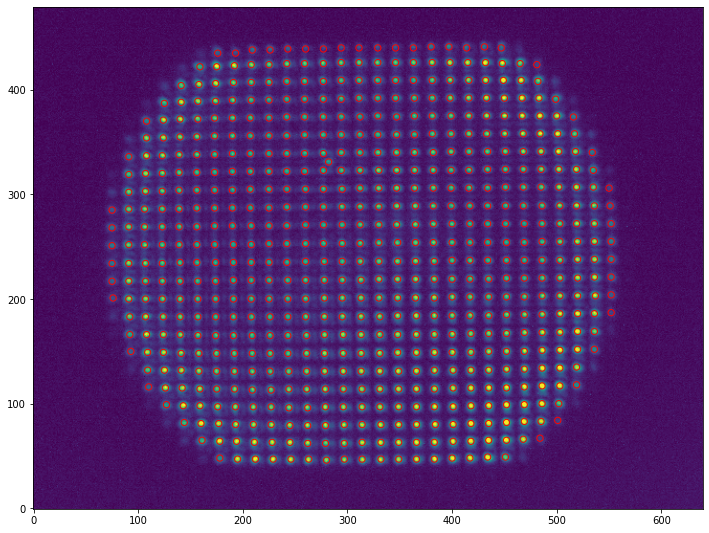

[[ 46 280]
 [ 47 195]
 [ 47 212]
 ...
 [441 380]
 [441 397]
 [441 431]]


In [471]:
Mos2 = multiple_centroids(im4)
print(Mos2)

663 stars detected


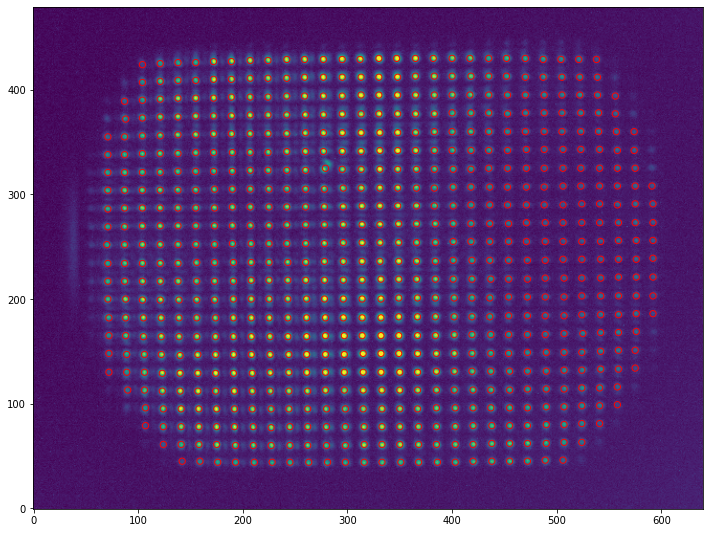

473 stars detected


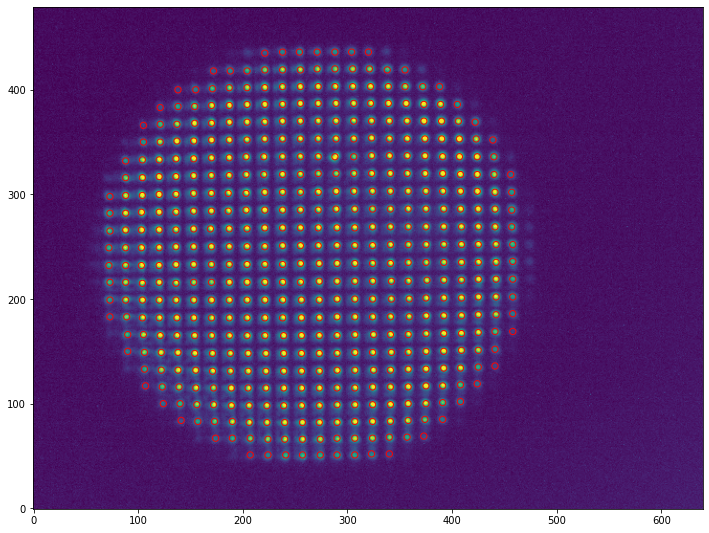

[[ 44 176]
 [ 44 193]
 [ 44 211]
 ...
 [430 435]
 [430 452]
 [430 470]]


In [470]:

MosN1 = multiple_centroids(N1,3, display_plot = True)
MosP1 = multiple_centroids(P1, display_plot = True)
print(MosN1)

530 stars detected


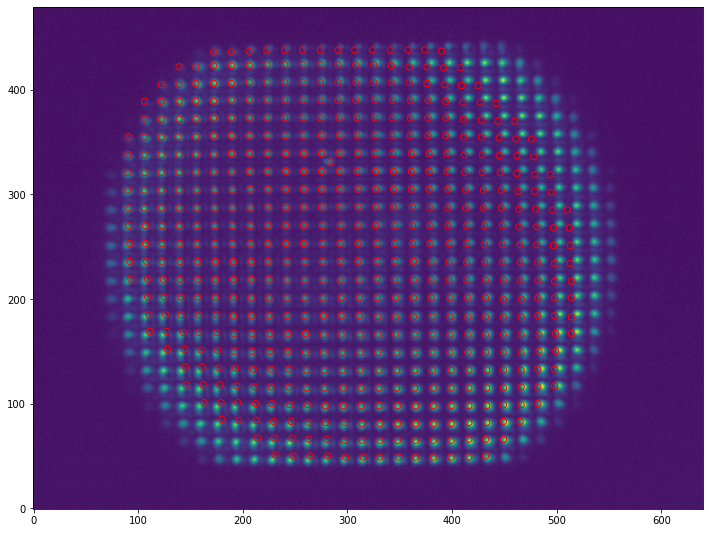

In [328]:
MosCvx = multiple_centroids(Cvx,display_plot = True)

Well here we can see the incredible differcne that the lens makes. In fact I think there was data taken incorrectly. We do get to see a wide range of things. We need to make some quiver plots so that we can note any changes here in magnitude and direction. 

In [482]:
from scipy.spatial import cKDTree

def quiver_plot_with_matching(Mos1, Mos2):
    '''This function is written to fix the discrepency between the image sizes. This function was created using 
    a mixture of scipy notes and helpful OH tips. The function looks to the nearest points for a specifc dot between the 
    first and second mosaics. This ensures that althugh the two are differnt sizes you can still see how the dots 
    change from one lens to another. The ckdTree function was the most helpful and the notes online are tagged below.
    
    The function works by building a multi-dimensional tree for the base image and then calcualtes the distance and 
    indicies to the points in the second image. This makes it easy to determine the overall displacement.
    
    Once these indicies and distances are created it is simple to coompute the overall displacement and then plot 
    the figure using the ax.quiver function which would create a quiver plot with arrows showing the displacemnt from
    one image to the next. 
    
    https://docs.scipy.org/doc/scipy/reference/generated/scipy.spatial.cKDTree.html
    
    '''
    
    # Data needs to be in arrays for this to work.
    Mos1 = np.array(Mos1)  
    Mos2 = np.array(Mos2)   
    

    # Build a k-d tree for the larger dataset 
    tree = cKDTree(Mos1)

    # Find the nearest neighbor in Mos1 for each point in Mos2
    distances, indices = tree.query(Mos2)

    # Extract the matching points from MosN1
    matched_Mos1 = Mos1[indices]

    # Compute displacements between matched points
    displacements = matched_Mos1 - Mos2
    U, V = displacements[:, 0], displacements[:, 1]  # x and y components

    # Extract coordinates for the smaller dataset 
    X, Y = Mos2[:, 0], Mos2[:, 1]

    # Create the quiver plot
    fig, ax = plt.subplots(figsize=(10, 6))
    q = ax.quiver(X, Y, U, V, angles='xy', color='b')
    ax.quiverkey(q, X=0.3, Y=1.1, U=1, label='Vector length = 1', labelpos='E')

    #Show the plot with basic labels and title
    ax.set_xlabel('X-axis')
    ax.set_ylabel('Y-axis')
    ax.set_title('Movement of dots after a lens has been used')
    ax.grid(True)

    plt.show()



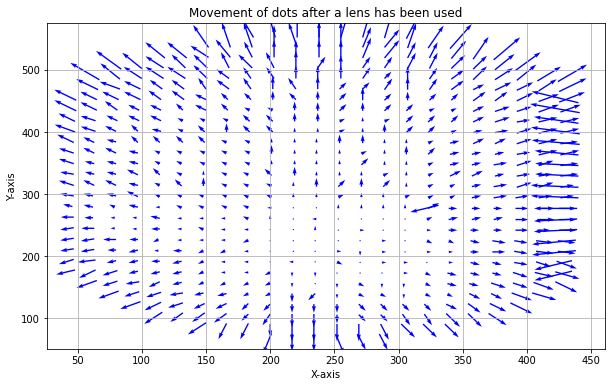

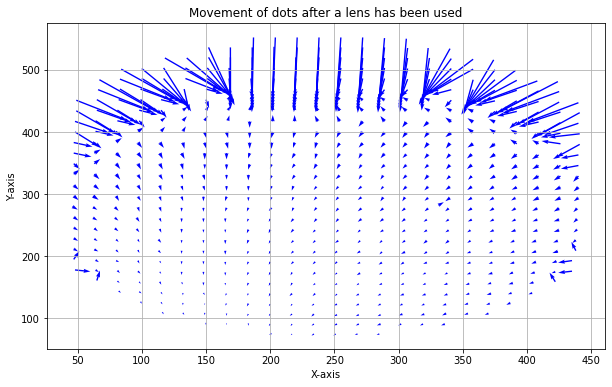

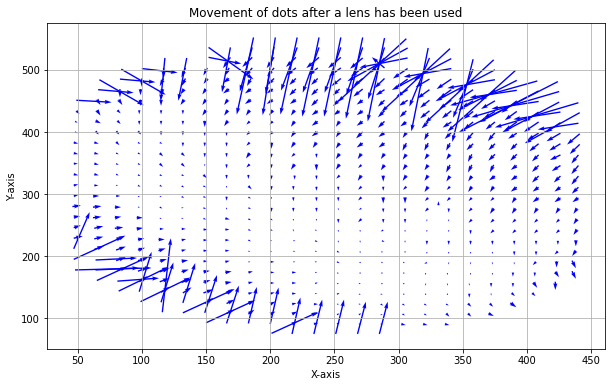

In [487]:
#Using this funciton we can create the quiver plots for each displacemnt showing just how much they change with lenses 

one = quiver_plot_with_matching(MosN1, Mos2) #Using -1.00 negatice lens
two = quiver_plot_with_matching(MosP1, Mos2) #Using a +1.00 positive lens
three = quiver_plot_with_matching(MosCvx, Mos2) #Using a cylindrical lens



319 stars detected


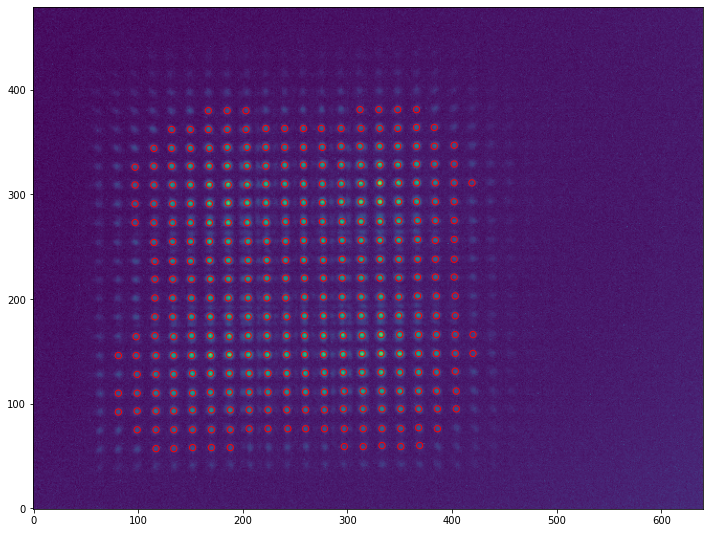

In [489]:
#For fun also wanted to examine the pattern formed in the -4.00 lens to discuss in the paper 
MosN4 = multiple_centroids(N4,3, display_plot = True)

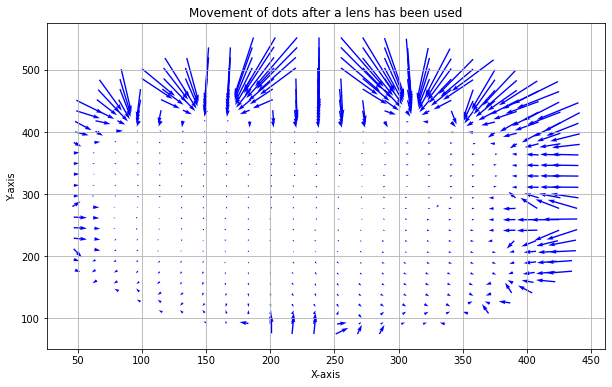

In [490]:
four = quiver_plot_with_matching(MosN4, Mos2) #Using a -4.00 lens, notice the pattern!


In [518]:

x, y = zip(*MosN4)

disp = []

for i in range(len(x)):
    print(i)
    if i+1 > len(x) - 1:
        break
    f = x[i] - x[i+1]
    disp.append(f)
    

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27